In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
gauge_df = pd.read_csv('gauge.csv', index_col=1)
gauge_df.drop('Year', axis=1, inplace=True)
gauge_df

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Week,,,,,,,,,,,,,,,,,,,,,
1,20.8,25.6,9.8,8.6,21.0,13.2,4.8,45.6,43.0,18.6,...,22.4,27.6,30.0,31.8,50.7,6.2,42.6,31.6,10.0,22.0
2,54.0,0.2,14.2,21.4,74.2,2.6,40.6,37.2,0.0,2.8,...,1.6,45.2,2.4,40.6,49.2,0.0,1.0,50.8,48.0,0.0
3,149.6,145.2,92.8,72.6,177.1,35.2,67.2,96.0,NaN,80.2,...,32.2,128.2,81.4,133.0,157.3,17.8,57.0,169.8,74.6,70.6
4,120.0,93.0,124.6,74.6,110.9,117.2,81.8,84.2,81.0,106.6,...,123.4,78.0,92.8,83.8,87.6,98.2,78.0,77.4,110.0,117.4
5,46.0,2.4,16.6,69.0,91.7,13.8,67.8,86.6,4.6,17.4,...,7.6,54.0,23.0,78.4,98.3,11.4,32.6,37.0,78.6,9.6
6,62.0,12.2,35.0,63.8,40.6,51.6,36.2,23.4,28.6,110.2,...,58.4,30.0,NaN,NaN,41.0,18.4,27.8,51.2,83.6,7.8
7,23.6,8.2,20.0,14.8,23.8,9.2,19.0,10.2,19.0,7.8,...,20.6,10.0,NaN,NaN,12.2,2.4,12.2,11.8,28.2,7.2
8,59.4,NaN,41.6,57.8,48.2,38.8,34.8,70.2,114.8,17.4,...,65.6,63.2,NaN,75.4,64.4,23.4,95.4,52.0,39.0,33.2
9,57.2,NaN,52.4,68.0,66.8,99.6,51.4,85.0,97.2,47.6,...,79.2,101.4,NaN,54.4,51.9,93.6,67.4,70.2,64.6,37.4


In [4]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


In [5]:
weeks = ['13', '15', '16', '17', '18',
'19', '20', '21', '22', '23',
'24', '26', '28', '29', '31',
'32', '33', '35', '36', '37',
'38', '39', '41', '44', '45',
'46', '47', '48', '49', '50',
'51']
weeksint = list(map(int, weeks))

In [6]:
radars = pd.read_csv('radars_withoutzero.csv', index_col=('lat', 'long'))
radars

13         15         16         17         18         19  \
lat long                                                                     
0   0     72.294636  45.855110  11.555313  58.455189  13.455605  12.315153   
    1     66.840412  48.700857  10.447831  70.463169  14.657457   8.156273   
    2     83.611426  47.329886  10.981148  56.940418  13.143666   9.930907   
    3     85.075782  56.994606  12.083639  54.885893  11.120173  21.864765   
    4     84.071118  58.285694  12.180566  45.201168  11.000099  21.605478   
    5     81.000618  62.580485  12.906918  63.381817  10.189529  14.932759   
    6     75.050963  47.807548  13.853209  45.000145  11.312839  18.564631   
    7     69.622593  36.806604  15.173553  44.059012   6.999031  24.044255   
    8     75.415726  44.439799  21.221386  41.478677   8.522376  20.535150   
    9     80.799770  38.762127  14.196516  42.314822  10.112614  22.923202   
    10    88.952362  48.825404  14.189509  43.037334  10.564469  24.769091   
    11    67.607992  43.428407  19.389224  45.856573  13.731943  39.140212   
    12    82.337083  55.022422  25.191416  49.070366   9.011621  38.093994   
    13    73.598865  43.690967  29.004852  47.343854   6.789391  38.276303   
    14    74.099537  33.933587  22.990523  53.451727   5.871494  25.049036   
    15    69.949984  38.577788  24.354472  47.717283   5.991415  23.502603   
    16    58.857954  35.211482  27.068866  45.465970   6.745562  24.827870   
    17    63.611651  40.072580  25.338785  49.671870  13.460533  26.248957   
    18    55.310330  26.255182  23.957110  46.633983   6.441950  27.079312   
    19    47.807378  41.673537  30.301792  56.839702   4.465359  25.305340   
    20    46.343358  37.932423  35.530166  57.952681   4.100811  24.958555   
    21    51.628587  41.433472  27.879652  54.734840  11.243045  23.813751   
    22    33.799957  36.049249  23.824927  45.686691   7.032058  21.753728   
    23    38.061438  22.054920  22.901268  42.325021   4.525209  18.037743   
    24    35.237193  21.151557  22.854403  39.697720   5.458045  18.349625   
    25    29.921178  26.965914  23.152746  37.138193   3.429814  14.786403   
    26    26.008595  30.367135  20.839060  47.680327   4.948408  10.898731   
    27    31.411207  31.116907  17.766202  53.195086   4.646479  12.440357   
    28    29.238136  28.613753  14.259841  48.765019   3.197744  13.602017   
    29    27.897484  27.977204  15.024944  49.364922   3.542734  12.286964   
...             ...        ...        ...        ...        ...        ...   
479 450    3.895652  27.335498   9.300706  34.102993  23.004700  37.185581   
    451    4.143867  27.100346   9.437463  33.042230  24.172179  26.303463   
    452    2.718477  35.954321  11.334425  33.081482  20.052160  20.102243   
    453    2.895287  30.341820  16.255109  25.526326  18.101865  23.265013   
    454    2.347490  30.683711  16.916186  32.839361  19.244993  22.345330   
    455    2.209984  19.704371  16.767955  24.257775  11.540397  17.117174   
    456    2.687970  20.260268  16.830567  24.494807  11.214827  18.570039   
    457    2.257521  22.859697  17.703632  20.714921  11.050434  15.817782   
    458    2.080575  18.507872  20.826899  24.933276  18.468390  23.060887   
    459    2.449814  29.168581  20.949467  25.511380   9.515603  12.733421   
    460    2.502157  28.927488  21.175556  22.576130   9.587660  12.547998   
    461    3.263567  16.047487  19.555455  22.000041  11.788778  15.785981   
    462    5.232785  21.492646  21.123743  21.819300  19.172278  13.331839   
    463    5.953080  25.404933  20.215508  12.057003  18.450495  13.060885   
    464    8.936635  25.088651  20.037061  13.287129  25.090779  18.573500   
    465    9.243754  27.632781  22.953264  16.726461  25.548268  20.271097   
    466    5.059429  33.037434  26.840768  13.576660  17.396313  23.915948   
    467    8.382332  38.356876  20.918624  14.419809  25.019117  23.710352   
    468   11.711408  42.013839  27.3376

In [7]:
print(len(radars[weeks[1]]))

230400


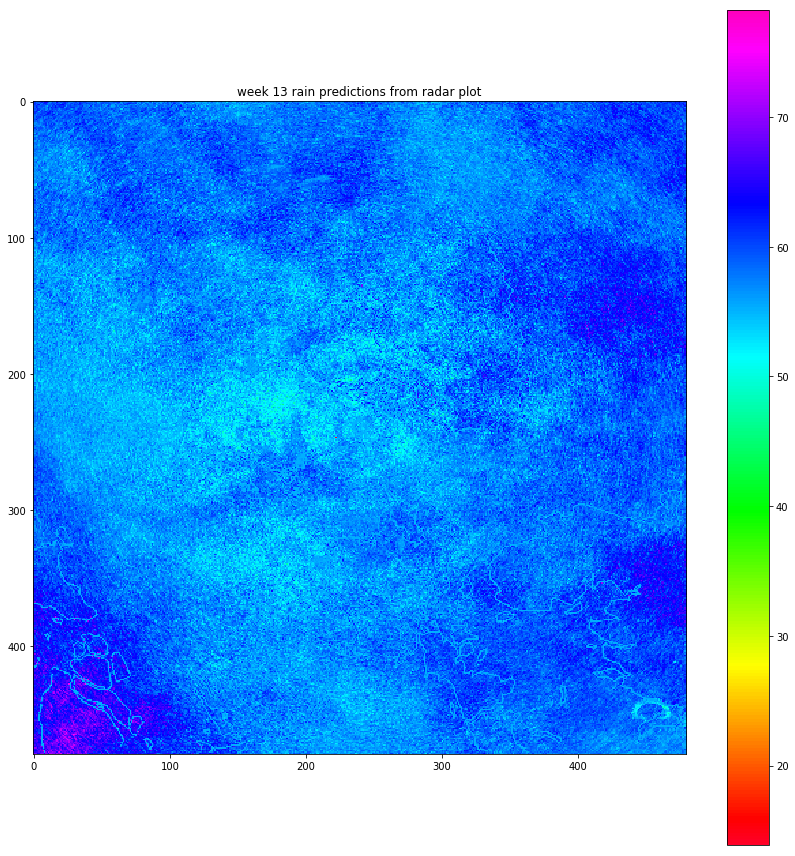

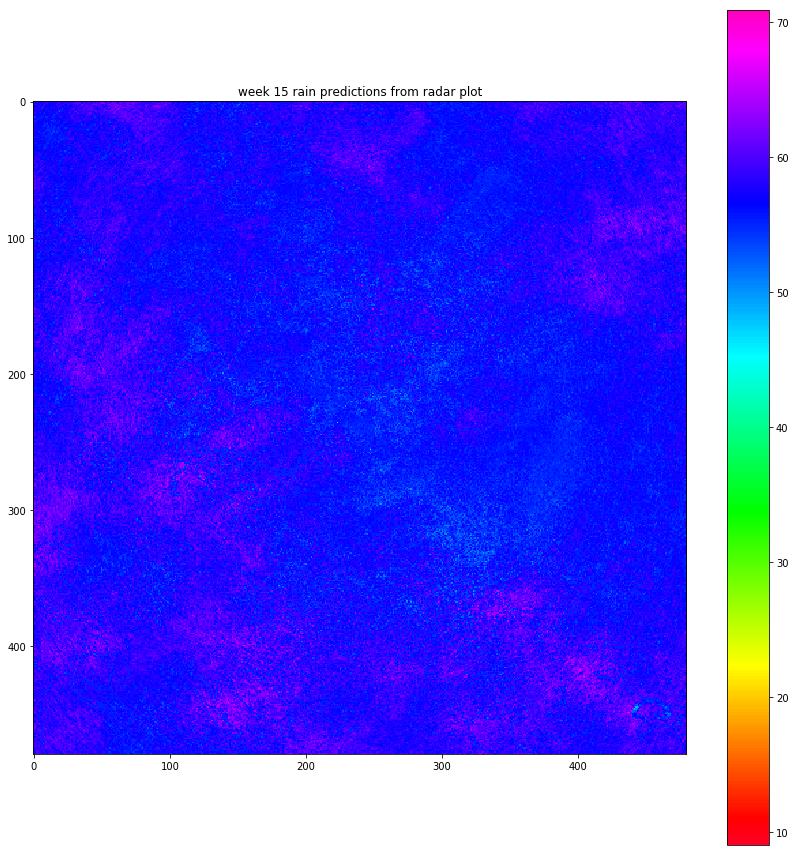

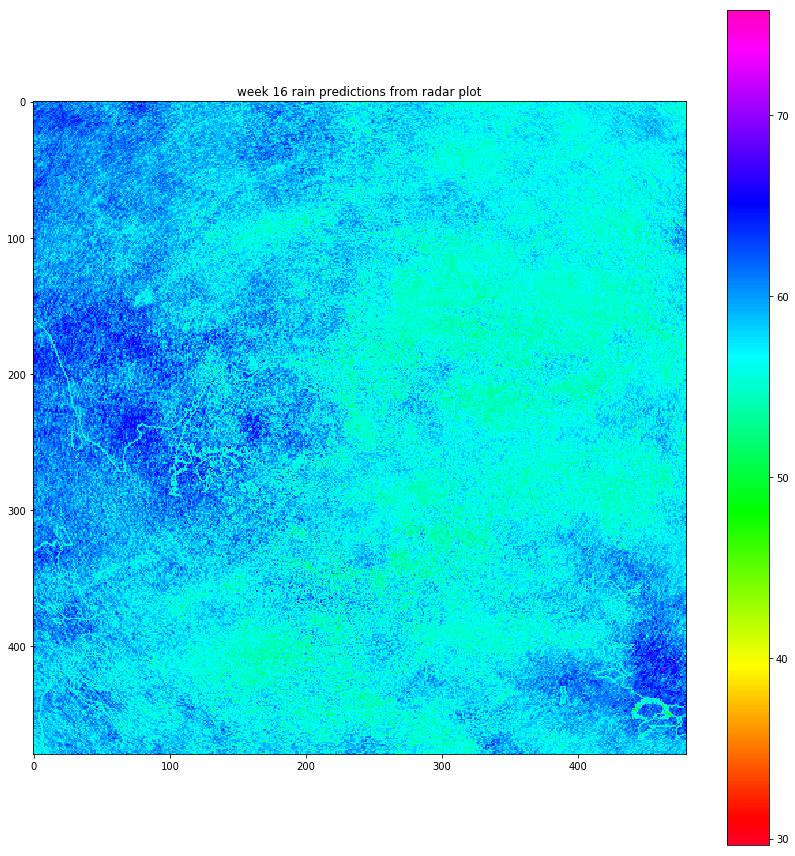

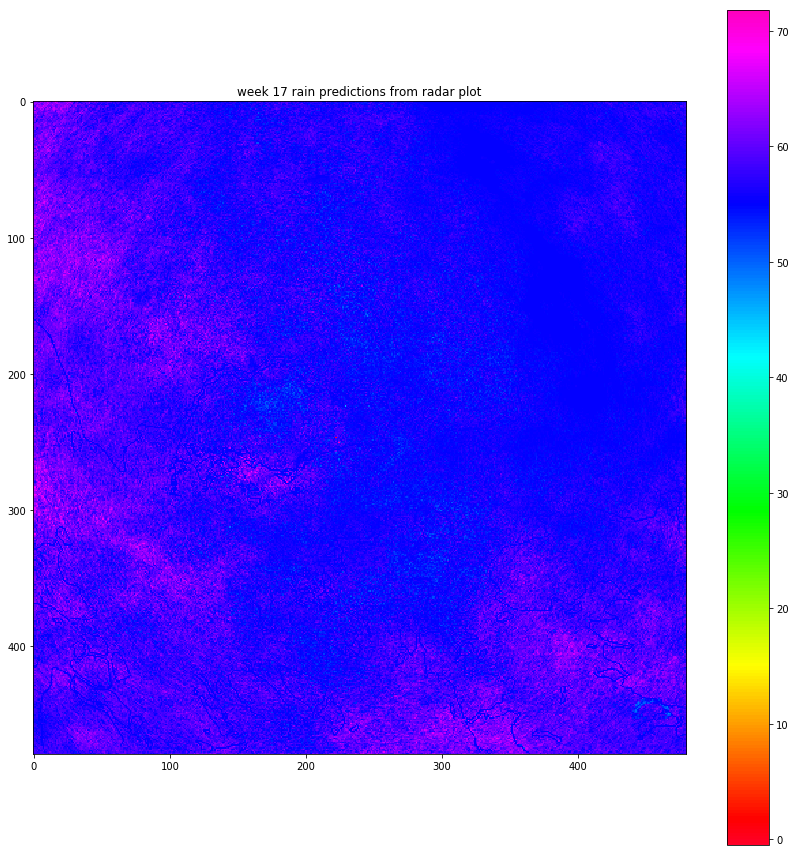

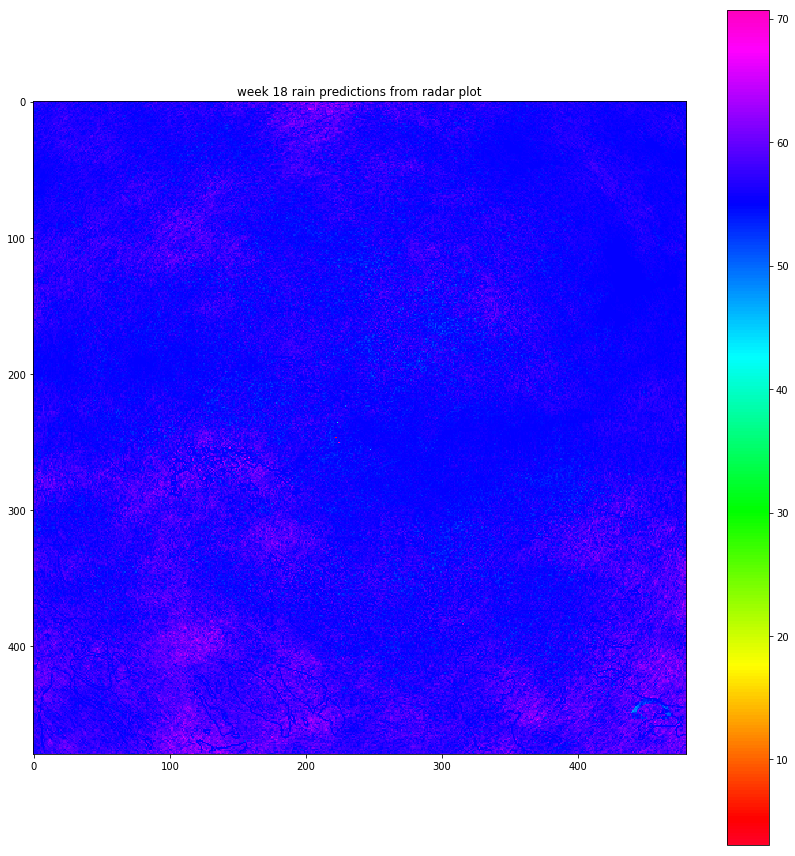

...

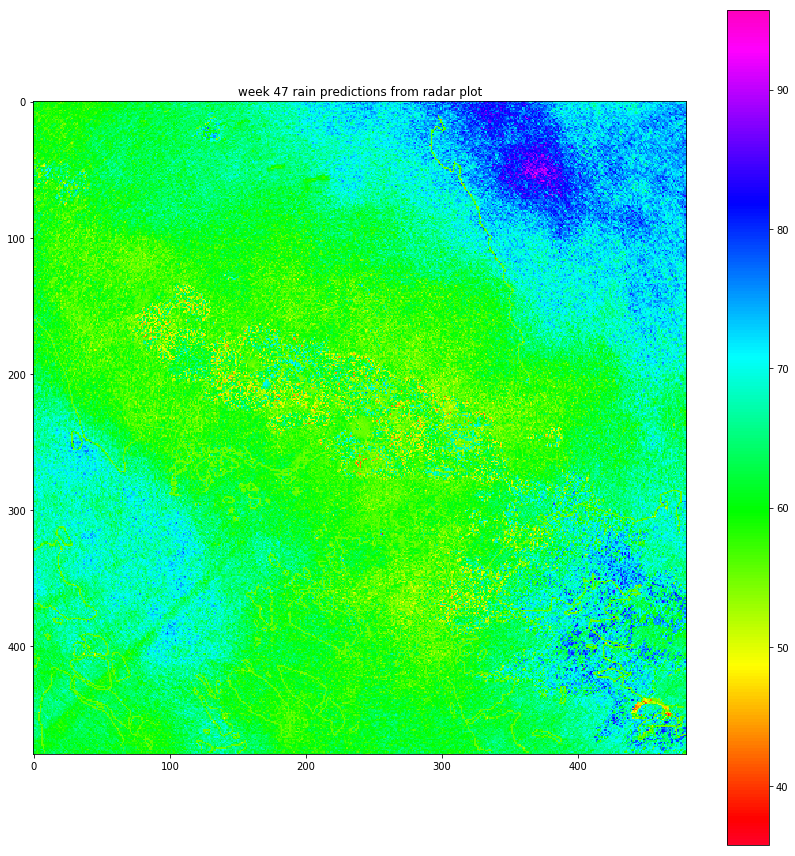

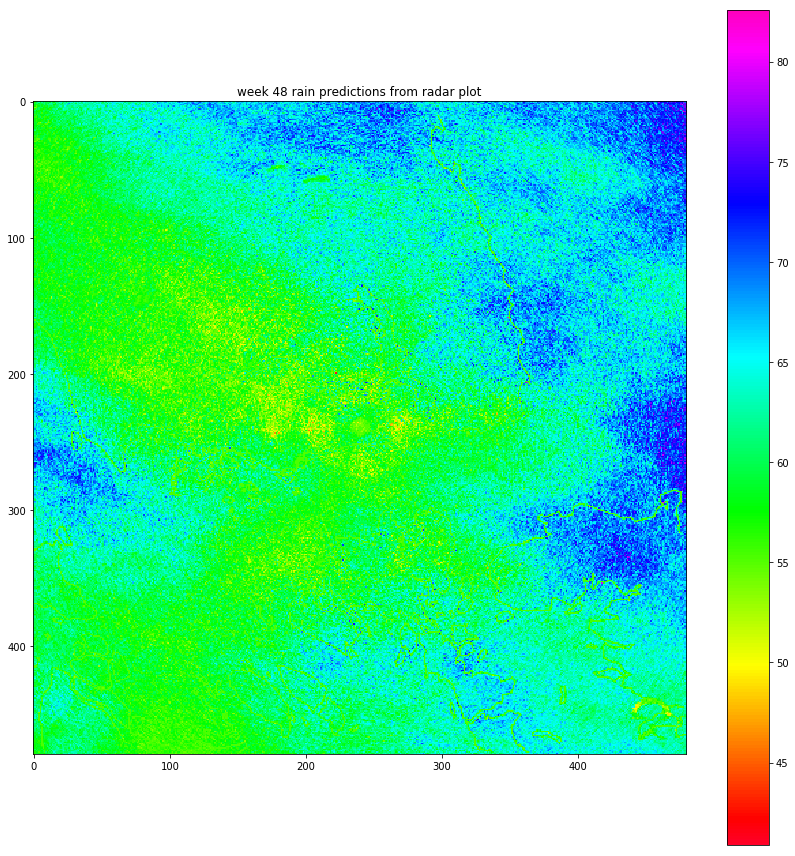

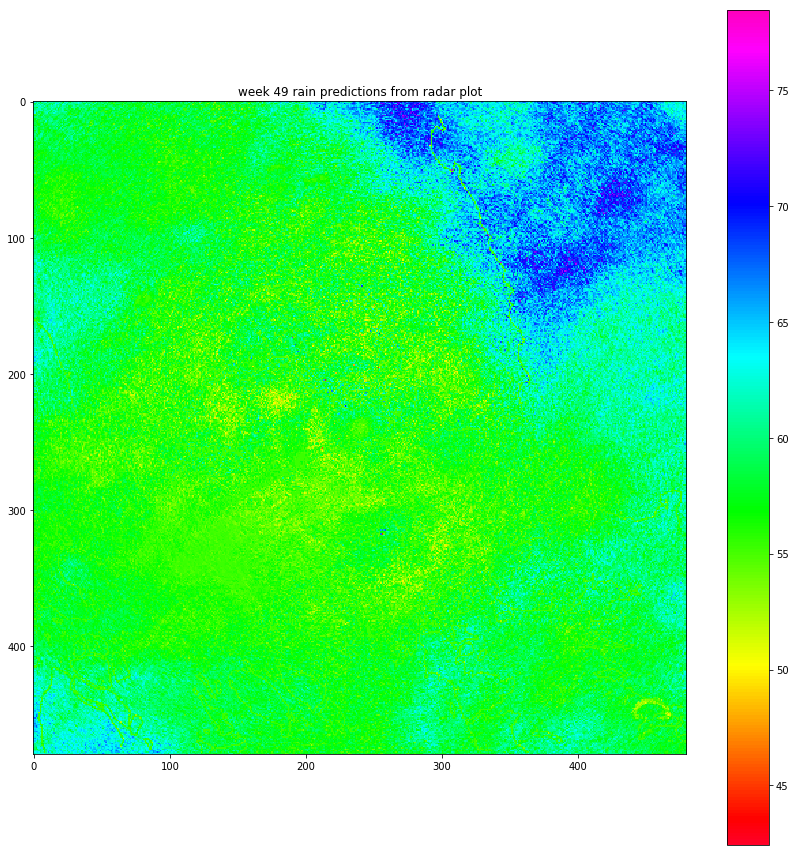

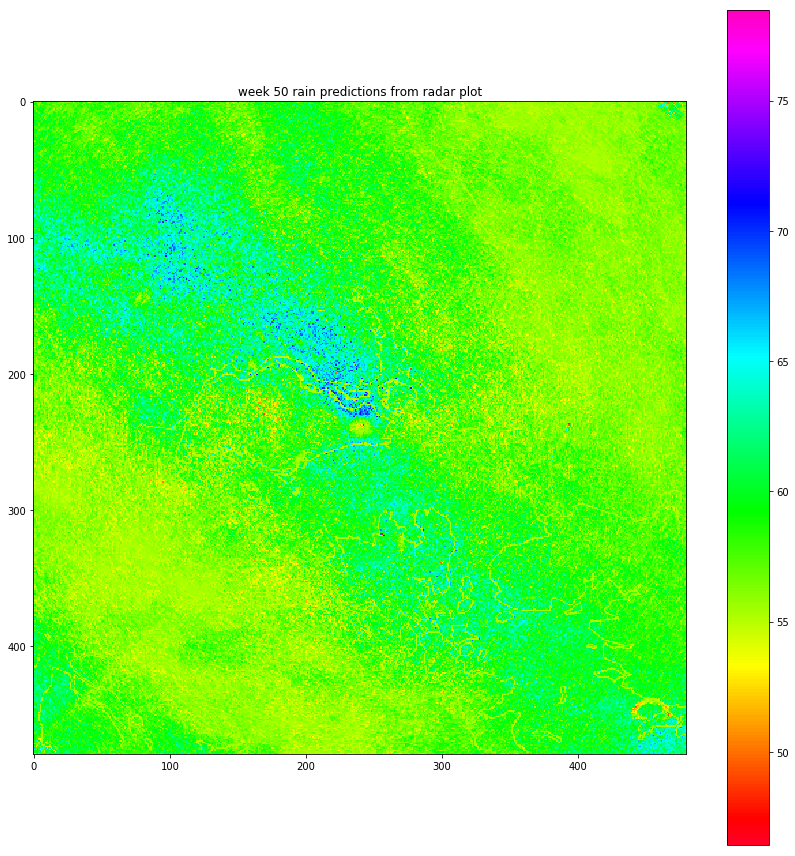

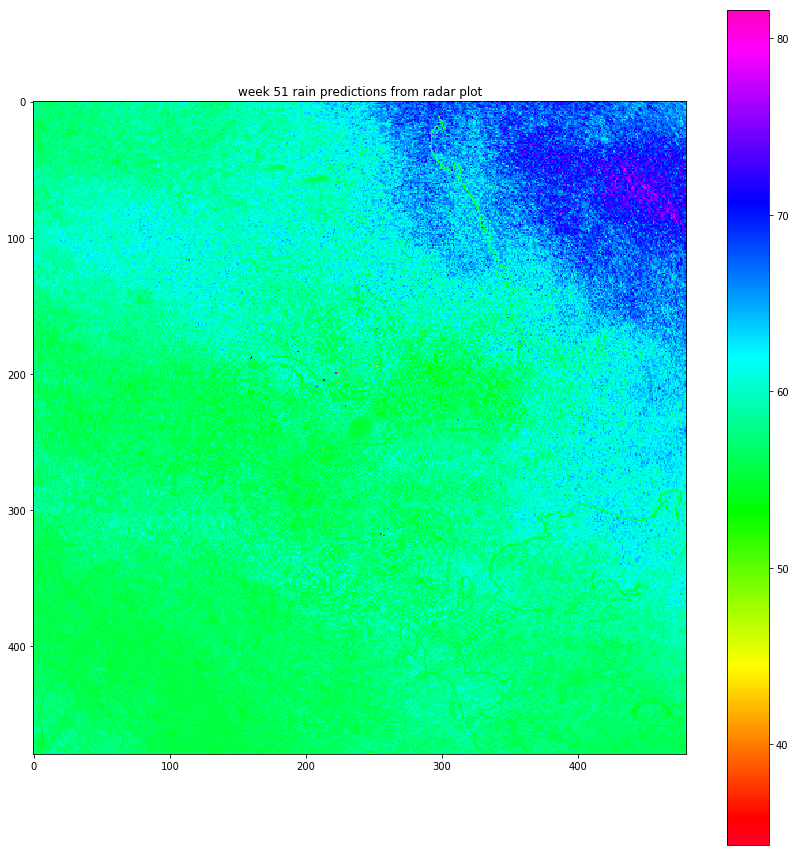

In [14]:
import matplotlib.cm as cm

for week in weeks:
    try:
        temp = radars[week]
        plt.figure(figsize=(12,12))
        plt.imshow(np.load('wk{}.npy'.format(week))
               ,cmap=cm.gist_rainbow)
        plt.title("week {} rain predictions from radar plot".format(week))
        plt.colorbar()
        plt.tight_layout()
        plt.savefig("img/week{}_a".format(week))
        plt.show()
    except:
        pass

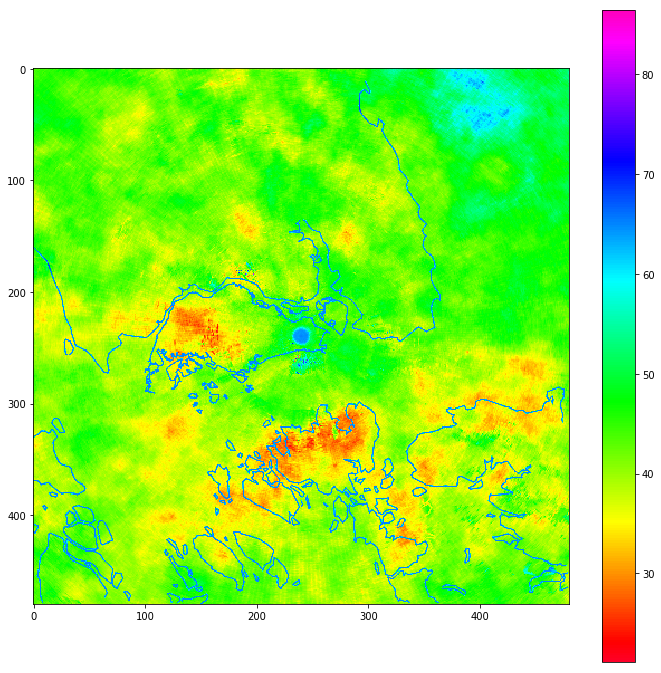

(20, 21.10358486651516, (235, 164), True)


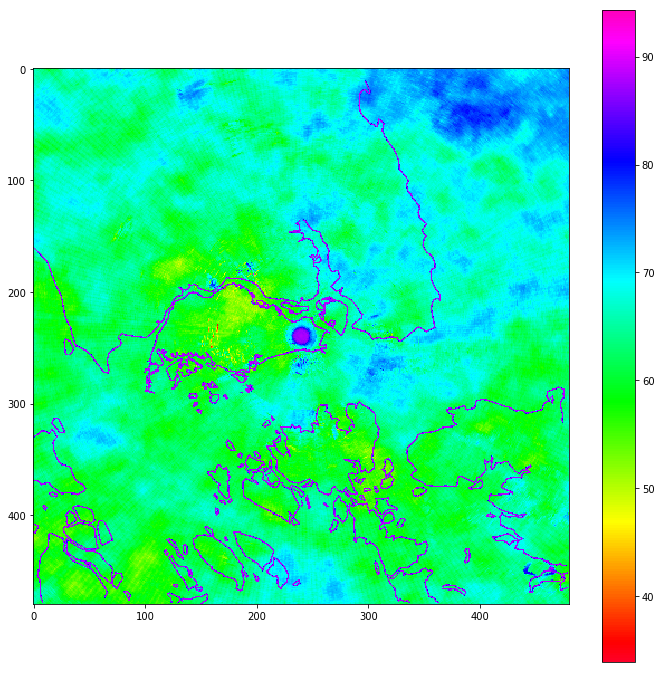

(21, 33.86240286190968, (230, 165), True)


In [19]:
import matplotlib.cm as cm


    
    

# for station in range(20, 22):
#     actual = np.array(gauge_df.loc[weeksint, str(station)])
#     rmse = 1000000
#     best = None
    
#     temp = []

#     for index, row in radars.iterrows():
#     #     if index[1] == 0 and index[0] % 50 == 0:
#     #         print(index)
#         pred = np.array(row[weeks])
#         temp_rmse = np.sqrt(np.nanmean((pred-actual)**2))
#         temp.append(temp_rmse)
#         if temp_rmse < rmse:
#             rmse = temp_rmse
#     #         print(rmse)
#             best = index
#     plt.figure(figsize=(12,12))
#     plt.imshow([temp[480*i:480*(i+1)] for i in range(480)],cmap=cm.gist_rainbow)
#     plt.colorbar()
#     plt.show()
#     print(station, rmse, best, np.isnan(actual).any())

In [ ]:
# plt.plot(station0, label='actual')
# plt.plot(radars.loc[249, 217], label='pred')
# plt.legend(['actual', 'pred'])

In [15]:
dist = '''0 28.008086042011353 (183, 172) False
1 26.15360146133119 (257, 123) False
2 25.62340856840756 (256, 219) True
3 23.316653926036135 (217, 225) True
4 35.21764470014104 (184, 171) False
5 18.279831889484154 (249, 159) True
6 21.195118110048707 (208, 221) True
7 30.91528195702736 (198, 171) False
8 29.38546724611004 (257, 123) True
9 18.74574314714128 (263, 181) False
10 22.718058261789952 (276, 133) False
11 23.116617680945932 (243, 159) False
12 26.343817226518684 (197, 172) False
13 20.795862180609912 (258, 196) True
14 13.495611463308052 (238, 161) True
15 23.9726931928839 (249, 159) True
16 23.22188933153434 (268, 195) False
17 20.754033434140688 (198, 171) True
18 32.06791720146837 (254, 161) True
19 24.358428632396244 (232, 165) True
20 21.10358486651516 (235, 164) True
21 33.86240286190968 (230, 165) True
22 1000000 None True
23 25.079472150893565 (197, 172) False
24 21.81735759249949 (232, 165) False
25 18.55330394632467 (253, 160) True
26 26.360625555869106 (230, 133) True
27 19.50263256973228 (243, 159) True
28 23.393621111355227 (253, 160) True
29 12.523625556662612 (337, 259) True
30 20.26512423766145 (250, 164) False
31 21.039239068684637 (241, 153) True
32 24.009961071349203 (249, 160) True
33 31.53196180714915 (254, 140) True
34 36.51599110615894 (184, 171) True
35 23.936591674109412 (197, 172) True
36 15.391531923071435 (258, 196) True
37 21.81274136978743 (261, 125) True
38 26.00114349602155 (183, 172) True
39 30.836406725806278 (230, 165) True
40 14.195937843626606 (262, 188) True
41 22.736953610208936 (248, 159) True
42 20.149580662470246 (196, 145) True
43 24.028530853221955 (184, 191) True
44 26.02983491613978 (198, 171) False
45 20.550143188988198 (263, 155) False
46 24.404475005134646 (256, 126) True
47 16.191692514241833 (249, 177) True
48 26.443163436167527 (212, 239) True
49 14.603399236575044 (304, 155) True'''

In [16]:
dist.split
dist.split(" (")
dist[1].split(") ")

[' ']

In [17]:
dist

'0 28.008086042011353 (183, 172) False\n1 26.15360146133119 (257, 123) False\n2 25.62340856840756 (256, 219) True\n3 23.316653926036135 (217, 225) True\n4 35.21764470014104 (184, 171) False\n5 18.279831889484154 (249, 159) True\n6 21.195118110048707 (208, 221) True\n7 30.91528195702736 (198, 171) False\n8 29.38546724611004 (257, 123) True\n9 18.74574314714128 (263, 181) False\n10 22.718058261789952 (276, 133) False\n11 23.116617680945932 (243, 159) False\n12 26.343817226518684 (197, 172) False\n13 20.795862180609912 (258, 196) True\n14 13.495611463308052 (238, 161) True\n15 23.9726931928839 (249, 159) True\n16 23.22188933153434 (268, 195) False\n17 20.754033434140688 (198, 171) True\n18 32.06791720146837 (254, 161) True\n19 24.358428632396244 (232, 165) True\n20 21.10358486651516 (235, 164) True\n21 33.86240286190968 (230, 165) True\n22 1000000 None True\n23 25.079472150893565 (197, 172) False\n24 21.81735759249949 (232, 165) False\n25 18.55330394632467 (253, 160) True\n26 26.360625555

In [5]:
a = [1,2,3]

In [9]:
a[0:3]

[1, 2, 3]